# Task 3 - Learning from the present to fill in gaps in the past

Should contain:

* Exploit data from two sources (e.g. large scale gridded analysis and in situ observations) – clearly articulating their provenance.

* Apply both supervised (e.g. discrimination, classification, or other supervised ML) and unsupervised (e.g. PCAs, Cluster analysis, or other unsupervised ML)  statistical techniques in some way in a clear,  transparent and reproducible way.

* Clear and illuminating text (approx. 2000 words) including appropriate references and 4-5 figures outlining the environmental challenge and demonstrating the insights of the statistical techniques.

What I have done (and will do):

* use hourly rain gauge data and enteroccoci data to try and fill in gaps of enteroccoci sampling

* hourly rain data instead of individual rain gauges use an area average from Concord, Gladesville and Lilyfield. These contain the least missing entries so gives fullest data and is good amount of area

* align enteroccoci and rain data to get previous 24 and 48 hour totals of rain **from the time the sample was taken**. It may be the case that these have to change as otherwise how can they match unless they happened to be sampled at the same time?

* form PC model of time series at Dawn Fraser pool

* try to use Dawn Fraser model to fill in gaps at other sites in the area

* fill in rain data then somehow do something else?

The challenge being looked at is how quick is recovery after rain and can predictions of enteroccoci be made to help forecast when swim sites will be shut.


In [1]:
using Pkg
Pkg.activate("..")

  Activating environment at `~/Documents/GitHub/MATH5271/Project.toml`


In [2]:
using DataFrames, CSV, Dates, Plots, Statistics, LinearAlgebra

## Rain gauge data

**Describe clearly rain data**

The rain gauge data is from several rain gauages along the Parramatta river (get the google image in here if possible).
The data from the gauges is hourly.

In [3]:
data_path = joinpath("../..", "Riverwatch/Data/raw")
rain_path = joinpath(data_path, "rain_hourly.csv")
rain_data = CSV.File(rain_path)
rain = DataFrame(rain_data)
date_format = Dates.DateFormat("d/m/Y")
new_dates = parse.(Date, rain[:, :date], date_format)
find = findfirst(new_dates .== Date(0000, 01, 01))
new_dates[1:find-1] .+= Year(1900)
new_dates[find:end] .+= Year(2000)
datetime = @. new_dates + rain[:, :time] 
rain =  rain[!, Not([:date, :time])]
insertcols!(rain, 1, :datetime => datetime)
first(rain, 5)

,datetime,Homebush,WestRyde,Concord,Lilyfield,Fivedock,Gladesville
,DateTime,Float64?,Float64?,Float64?,Float64?,Float64?,Float64?
1,1996-01-01T00:00:00,0.0,0.0,0.0,0.0,0.0,0.0
2,1996-01-01T01:00:00,0.0,0.0,0.0,0.0,0.0,0.0
3,1996-01-01T02:00:00,0.0,0.0,0.0,0.0,0.0,0.0
4,1996-01-01T03:00:00,0.0,0.0,0.0,0.0,0.0,0.0
5,1996-01-01T04:00:00,0.0,0.0,0.0,0.0,0.0,0.0


Now have a `DataFrame` with the hourly rain from each rain gauge in the area of the Parramatta river swim sites.
We can get a summary of this data to look at some summary statistics.

In [4]:
describe(rain)

,variable,mean,min,median,max,nmissing
,Symbol,Union…,Any,Union…,Any,Int64
1,datetime,,1996-01-01T00:00:00,,2021-04-01T01:00:00,0
2,Homebush,0.111786,0.0,0.0,77.0,118887
3,WestRyde,0.117512,0.0,0.0,50.5,68507
4,Concord,0.105908,0.0,0.0,46.5,3087
5,Lilyfield,0.122417,0.0,0.0,56.0,964
6,Fivedock,0.129592,0.0,0.0,46.5,118530
7,Gladesville,0.113492,0.0,0.0,53.5,1079
8,Ashfield,0.128189,0.0,0.0,62.0,121538


We can see the mean rainfall over the time period is reasonably similar (as we would expect with the rain gauges being close to each other) ranging from 0.11 (2 decimal places) at Concord to 0.13 (2 decimal places) at Ashfield.

From the summary there are also many missing values at Homebush, Fivedock and Ashfield **find out why if possible**.
Taking an area average of all the rain gauges here is not desireable because of all the `missing` data.
Instead we take an average of the Gladesville, Concord and Lilyfield gauges as they contain the least amount of `missing` data.
There will still be missing data but we will either remove these or replace with zero when we take the anomaly.

Then we can use principal componenets to generate reconstructed rain data that we can test on readings taken from the remaining rain gauages.
This will be useful to compare if a reconstruction is more useful than just the area average rainfall.

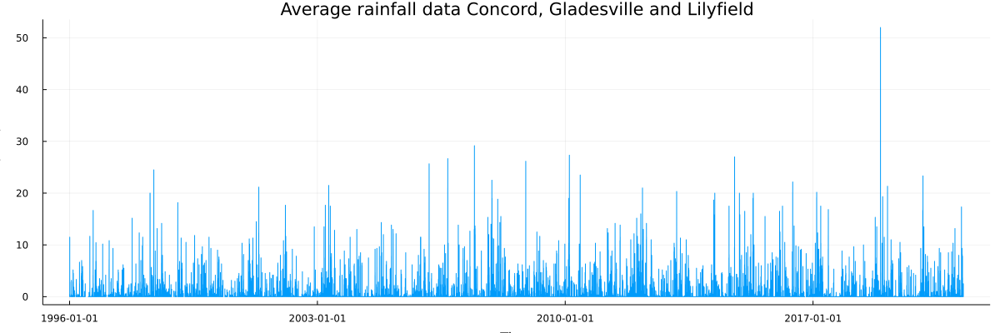

In [5]:
area_av = (rain[:, :Concord] .+ rain[:, :Gladesville] .+ rain[:, :Lilyfield]) ./ 3
plot(rain[:, :datetime], area_av, size = (1200, 400), label = false, xlabel = "Time", ylabel = "Rain (mm)", title = "Average rainfall data Concord, Gladesville and Lilyfield")

In [6]:
df_area_av = DataFrame(datetime = datetime, area_av = area_av)
describe(df_area_av)

,variable,mean,min,median,max,nmissing
,Symbol,Union…,Any,Union…,Any,Int64
1,datetime,,1996-01-01T00:00:00,,2021-04-01T01:00:00,0
2,area_av,0.112598,0.0,0.0,52.0,4559


### Rain data reconstruction

I am starting to think that the rain data reconstruction using this method is not the way to go.

Better would be to use the rain average data and somehow model ent to fill in the gaps. 

## Bacteria data

The bacteria we are looking at is called enterococci. 
A measure of this bacteria in the water is an indication of how polluted the water is and whether or not a swim site will be shut for swimming.

Three swim sites will be considered, these are:
* Dawn Fraser pool
* Chiswick baths
* Cabarita beach.

The bacteria is sampled far less frequently than the rain.
During the swim season, October to **not sure**, samples are taken every six days while during winter samples are only taken once a month.

This means there is lots of data to be filled in.

**Mention categories for both rain and bacteria.**

In [7]:
ent_path = joinpath(data_path, "ent_routine.csv")
ent_data = CSV.File(ent_path)
ent = DataFrame(ent_data)
new_dates = parse.(Date, ent[:, :Date], date_format)
datetime = @. new_dates + ent[:, :time] 
datetime = round.(datetime, Dates.Hour)
ent =  ent[!, Not([:Date, :time, :Nearest_hr])]
insertcols!(ent, 1, :datetime => datetime)
find = findall(ent[:, :location] .== "Dawn Fraser Pool") 
append!(find, findall(ent[:, :location] .== "Cabarita Beach"))
append!(find, findall(ent[:, :location] .== "Chiswick Baths"))
ent = ent[find, :]
first(ent, 5)

,datetime,location,ent
,DateTime,String31,Float64
1,1994-10-05T10:00:00,Dawn Fraser Pool,1.0
2,1994-10-11T11:00:00,Dawn Fraser Pool,0.0
3,1994-10-17T11:00:00,Dawn Fraser Pool,41.0
4,1994-10-22T09:00:00,Dawn Fraser Pool,79.0
5,1994-10-29T09:00:00,Dawn Fraser Pool,1.0


## Match rain and bacteria data

The bacteria is not sampled at a regular time.
The rain data to 9am could be used though here we are going to round the bacteria collection time to the nearest hour then match that to a rain date/time and find the previous 24 hour and 48 hour rainfall.

Models using both the 24 hour and 48 rainfall will then be computed.

First we remove dates that do not cross over between the bacteria and rain data.
Then match up date and time of bacteria sample to a rain date and time and sum the previous 24 and 48 entries.

In [8]:
find = findall(ent[:, :datetime] .< rain[1, :datetime])
delete!(ent, find)
find = findall(ent[:, :datetime] .> rain[end, :datetime])
delete!(ent, find);

In [106]:
rain_24 = Array{Union{Missing, Float64}}(undef, length(ent[:, :datetime]))
rain_48 = Array{Union{Missing, Float64}}(undef, length(ent[:, :datetime]))

for i in 1:length(ent[:, :datetime])
    
    match = findall(ent[i, :datetime] .== df_area_av[:, :datetime])[1]
    rain_24[i] = sum(df_area_av[(match - 24):match, :area_av])
    rain_48[i] = sum(df_area_av[(match- 48):match, :area_av])
    
end

rain_24_mean = mean(skipmissing(rain_24))
rain_48_mean = mean(skipmissing(rain_48))
ent_mean = mean(ent[:, :ent])
rain_24_anom = rain_24 .- rain_24_mean
rain_48_anom = rain_48 .- rain_48_mean
ent_anom = ent[:, :ent] .- ent_mean;

Now we can form a data frame that has all the information from the rain and bacteria data in one.

In [107]:
ent_rain = DataFrame(datetime = ent[:, :datetime], 
                    location = ent[:, :location], 
                    rain_24 = rain_24, 
                    rain_24_anom = rain_24_anom, 
                    rain_48 = rain_48, 
                    rain_48_anom = rain_48_anom,
                    ent = ent[:, :ent],
                    ent_anom = ent_anom)
describe(ent_rain)

,variable,mean,min,median,max
,Symbol,Union…,Any,Union…,Any
1,datetime,,1996-01-05T09:00:00,,2021-03-31T13:00:00
2,location,,Cabarita Beach,,Dawn Fraser Pool
3,rain_24,2.96814,0.0,0.0,93.8333
4,rain_24_anom,6.457e-15,-2.96814,-2.96814,90.8652
5,rain_48,5.71133,0.0,0.166667,116.5
6,rain_48_anom,-5.95361e-16,-5.71133,-5.54466,110.789
7,ent,148.638,0.0,5.0,28000.0
8,ent_anom,-3.98355e-15,-148.638,-143.638,27851.4


## Dawn Fraser

Dawn Fraser pool has the most entries for `ent` so we take this and form a principal component model.
An instant simplifaction is that now instead of two rather large datasets now just have one PC model which is quite good.

In [109]:
find = findall(ent_rain[:, :location] .== "Dawn Fraser Pool")
ent_rain_df = dropmissing(ent_rain[find, :])
first(ent_rain_df, 5)

,datetime,location,rain_24,rain_24_anom,rain_48,rain_48_anom
,DateTime,String31,Float64,Float64,Float64,Float64
1,1996-01-16T09:00:00,Dawn Fraser Pool,0.0,-2.96814,0.0,-5.71133
2,1996-01-28T13:00:00,Dawn Fraser Pool,0.0,-2.96814,0.0,-5.71133
3,1996-02-02T10:00:00,Dawn Fraser Pool,0.0,-2.96814,0.333333,-5.37799
4,1996-02-09T10:00:00,Dawn Fraser Pool,5.66667,2.69853,5.66667,-0.0446588
5,1996-02-15T12:00:00,Dawn Fraser Pool,3.0,0.0318593,7.83333,2.12201


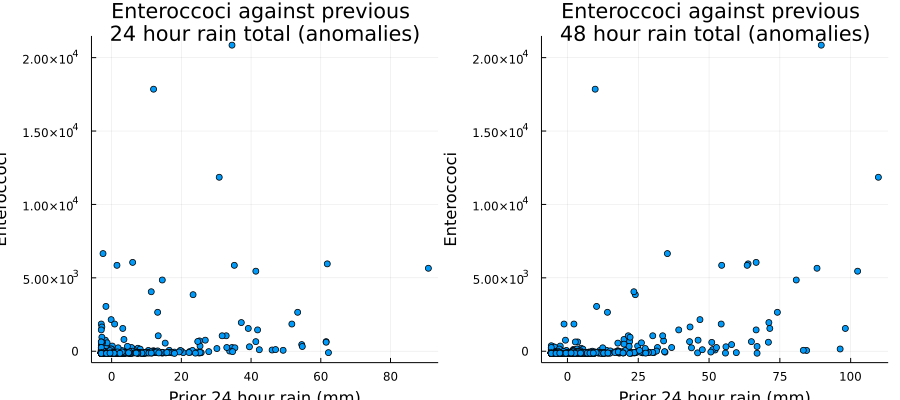

In [100]:
scatter_24 = scatter(ent_rain_df[:, :rain_24_anom], ent_rain_df[:, :ent_anom], 
                    xlabel = "Prior 24 hour rain (mm)", 
                    ylabel = "Enteroccoci", 
                    title = "Enteroccoci against previous \n24 hour rain total (anomalies)",
                    label = false)
scatter_48 = scatter(ent_rain_df[:, :rain_48_anom], ent_rain_df[:, :ent_anom], 
                    xlabel = "Prior 24 hour rain (mm)", 
                    ylabel = "Enteroccoci", 
                    title = "Enteroccoci against previous \n48 hour rain total (anomalies)",
                    label = false)
plot(scatter_24, scatter_48, size = (900, 400), layout = (1, 2))

In [97]:
ent_rain_df_mat = Matrix(ent_rain_df[:, [:rain_48_anom, :ent_anom]])
covmat = cov(ent_rain_df_mat)
λ, e = eigen(covmat)
e1 = e[end]
e2 = e[1]

u1 = sum(ent_rain_df_mat * e1, dims = 2)
#u2 = sum(ent_rain_df_mat * e1, dims = 2)
recon = e1 .* u1;

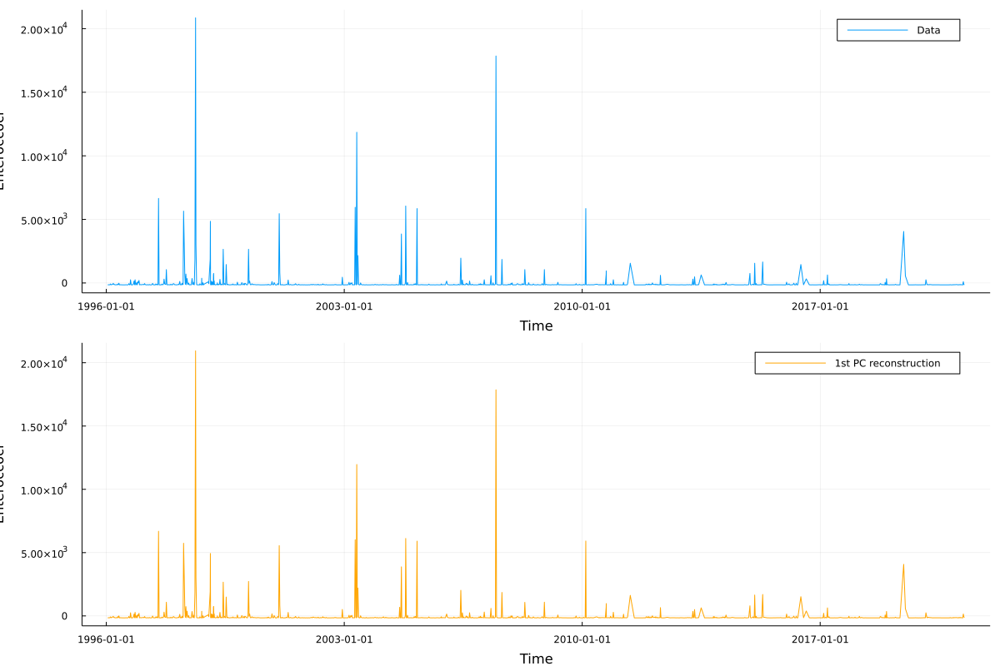

In [105]:
data_df_plot = plot(ent_rain_df[:, :datetime], ent_rain_df[:, :ent_anom], 
                    xlabel = "Time",
                    ylabel = "Enteroccoci",
                    label = "Data", 
                    size = (1200, 400))
recon_df_plot = plot(ent_rain_df[:, :datetime], recon, 
                    xlabel = "Time",
                    ylabel = "Enteroccoci",
                    label = "1st PC reconstruction",
                     size = (1200, 400), color = :orange)
plot(data_df_plot, recon_df_plot, size = (1200, 800), layout = (2, 1))

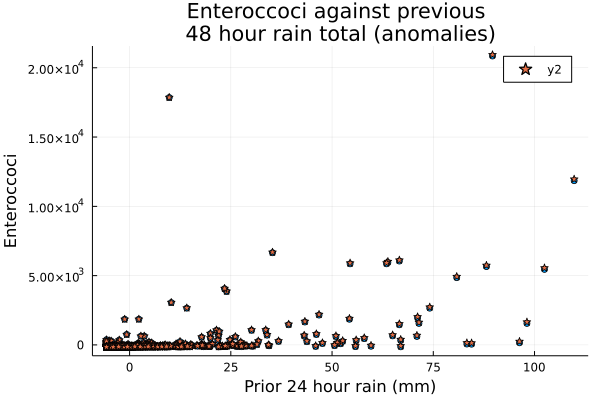

In [99]:
scatter!(scatter_48, ent_rain_df[:, :rain_48_anom], recon, marker = :star, label = "PC recon")

Could now take this and use to create a predicitive model for ent at another location?

### Chiswick baths

With the PCA model of Dawn Fraser pool can something be done to fill in gaps in the of the Chiswick baths data?

In [111]:
find = findall(ent_rain[:, :location] .== "Chiswick Baths")
ent_rain_cb = dropmissing(ent_rain[find, :])
describe(ent_rain_cb)

,variable,mean,min,median,max,nmissing
,Symbol,Union…,Any,Union…,Any,Int64
1,datetime,,1999-03-01T12:00:00,,2021-03-31T13:00:00,0
2,location,,Chiswick Baths,,Chiswick Baths,0
3,rain_24,2.86365,0.0,0.0,67.0,0
4,rain_24_anom,-0.10449,-2.96814,-2.96814,64.0319,0
5,rain_48,5.65297,0.0,0.166667,116.5,0
6,rain_48_anom,-0.0583553,-5.71133,-5.54466,110.789,0
7,ent,87.6187,0.0,4.0,13000.0,0
8,ent_anom,-61.0192,-148.638,-144.638,12851.4,0
